<a href="https://colab.research.google.com/github/lifesboy/selks-lstm-data/blob/main/SELKS_LSTM_Anomaly_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.LSTM KERAS

docs lib: https://keras.io/api/layers/recurrent_layers/lstm/

# 2.PREPARATION

In [1]:
#@title Check version vs GPU
!git --version
!python --version
!ray --version

import tensorflow as tf
print('tf version: ', tf.__version__)
print('tf.keras version:', tf.keras.__version__)

import sys
sys.version

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

git version 2.20.1
Python 2.7.16
ray, version 1.13.0
tf version:  2.7.0
tf.keras version: 2.7.0
Found GPU at: /device:GPU:0


2023-02-09 16:52:54.784612: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-09 16:52:57.124410: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-02-09 16:52:57.125594: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-02-09 16:52:57.126690: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capabilit

In [2]:
#@title Import Libraries
!mkdir -p /cic/images/

import sys
sys.path.insert(0, "/usr/local/opnsense/scripts/ml")

import json
import ray
import pyarrow
import pyarrow as pa
from pyarrow import csv
from pandas import DataFrame

from ray.data import Dataset
from ray.data.aggregate import Count

import numpy as np
from numpy import array
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras import Input


import common
from anomaly_normalization import PS, LABEL, PAYLOAD_FEATURE_NUM, ALL_FEATURES
from aimodels.preprocessing.cicflowmeter_norm_model import CicFlowmeterNormModel
from aitests.testutils import show_scattered_4d, show_weights, show_4d_imgs, show_train_metric, IMG,\
read_csv_in_dir, read_csv_in_dir_label_string

run, client = common.init_experiment(name='notebook')


2023-02-09 16:53:00,047[INFO][139834359392064-MainThread] worker.py:init(957) Connecting to existing Ray cluster at address: 172.18.12.180:6379


# 3.INPUT
Let's generate a sample input with time dimension as below:

In [3]:
#@title Generate an input sequence
#10.0.2.10
#10.0.2.155
#10.0.2.180
#10.0.2.181
#10.0.2.182
#192.168.66.39
#192.168.66.21

cell_size = 320 #@param {type:"integer"} #numberOfLSTMunits
hidden_size = 230 #@param {type:"integer"}
n_timesteps_in = 100  #@param {type:"integer"}
n_features = 79   #@param {type:"integer"}

# generate datasets
train_size= 40 #@param {type:"integer"}
test_size = 10  #@param {type:"integer"}
batch_size=32 #@param {type:"integer"}
epochs=100 #@param {type:"integer"}

L_source = '/cic/dataset/normalized_labeled/nsm-huongssh-label/' #@param {type:"string"}
L_data: Dataset = read_csv_in_dir(L_source)
L_count: DataFrame = L_data.groupby(LABEL).aggregate(Count()).to_pandas()

features = ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pkt_len_max', 'pkt_len_mean', 'pkt_len_min', 'pkt_len_std', 'pkt_len_var', 'pkt_size_avg', 'protocol', 'psh_flag_cnt', 'rst_flag_cnt', 'src_port', 'subflow_bwd_byts', 'subflow_bwd_pkts', 'subflow_fwd_byts', 'subflow_fwd_pkts', 'syn_flag_cnt', 'tot_bwd_pkts', 'tot_fwd_pkts', 'totlen_bwd_pkts', 'totlen_fwd_pkts', 'urg_flag_cnt']
#features = [*features, *[PS % i for i in range(0, PAYLOAD_FEATURE_NUM)]]
features = features[0: n_features]
Lpadding_features = sorted(list(set(features) - set(L_data.schema(fetch_if_missing=True).names)))

print ('features=', features)
print ('Lpadding_features=', Lpadding_features)

L_train = DataFrame.from_records(L_data.take(train_size * n_timesteps_in))
L_train[Lpadding_features] = 0
LX_train = L_train[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_train = L_train[[LABEL]].to_numpy().reshape((train_size, n_timesteps_in))

L_test = DataFrame.from_records(L_data.take(test_size * n_timesteps_in))
L_test[Lpadding_features] = 0
LX_test = L_test[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_test = L_test[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

2023-02-09 16:53:02,507	WARNING read_api.py:256 -- The number of blocks in this dataset (2) limits its parallelism to 2 concurrent tasks. This is much less than the number of available CPU slots in the cluster. Use `.repartition(n)` to increase the number of dataset blocks.
Shuffle Reduce: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


features= ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pk

In [4]:
L_count

,label,count()
0,0.0,2580
1,1.0,2434


## Data preview

### L_train preview

In [5]:
L_train[[LABEL, *features]]

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.761594,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,1.0,1.0,1.0,0.000000,0.0,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.999988,0.0,0.0,1.0,0.0,0.000000,1.0,0.761594,0.0,0.000000,0.761594,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,0.999956,0.0,1.0,0.0,0.0,0.737258,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,0.999988,1.0,1.000000,1.000000,0.0,0.0,1.0,1.0,1.0,0.999988,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,0.999977,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,1.000000,1.0,1.000000,0.0,1.000000,1.000000,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.000000,0.0,1.000000,0.0,1.0,0.0,0.0,0.761594,1.0,0.0,0.000000,1.0,1.0,0.0,0.0,0.000000,0.0,1.000000,0.761594,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,1.0,1.0,1.0,0.000000,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,0.0,1.0,1.0,0.761594,1.0,0.761594,0.0,0.761594,0.761594,1.0,1.0,0.0
3996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.000000,0.0,1.000000,0.0,1.0,0.0,0.0,0.761594,1.0,0.0,0.000000,1.0,1.0,0.0,0.0,0.000000,0.0,1.000000,0.761594,0.0,0.0,1.0,0.0,0.0,0

In [6]:
L_train[[LABEL, *features]].describe()

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
count,4000.000000,4000.0,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.0,4000.000000,4000.0,4000.0,4000.000000,4000.0,4000.0,4000.000000,4000.000000,4000.000000,4000.00000,4000.00000,4000.000000,4000.00000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.0,4000.000000,4000.000000,4000.0,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.00000,4000.0,4000.0,4000.0,4000.000000,4000.000000,4000.0,4000.000000,4000.0,4000.0,4000.0,4000.000000,4000.000000,4000.000000,4000.000000,4000.0,4000.000000,4000.000000,4000.000000,4000.000000,4000.0
mean,0.608500,0.0,0.000750,0.000750,0.000750,0.000750,0.033250,0.033250,0.997000,0.669000,0.669000,0.663212,0.668940,0.669000,0.997000,0.997000,0.997000,0.718184,0.033236,0.974158,0.0,0.997000,0.0,0.0,0.711466,1.0,0.0,0.585095,0.997500,0.997500,0.81725,0.81725,0.805234,0.81725,0.985519,0.917900,0.006250,0.006250,0.999750,0.730250,0.730250,0.726588,0.730250,0.730250,0.999750,0.999750,0.999750,0.773634,0.006248,0.975427,0.0,0.999750,0.999750,0.0,0.019750,0.019750,0.019750,0.019750,0.164750,0.77775,1.0,1.0,1.0,0.994592,0.994557,1.0,0.999990,0.0,0.0,1.0,0.997000,0.940153,0.999750,0.952956,0.0,0.940153,0.952956,0.997000,0.999750,0.0
std,0.488147,0.0,0.027379,0.027379,0.027379,0.027379,0.179311,0.179311,0.054697,0.470632,0.470632,0.472632,0.470605,0.470632,0.054697,0.054697,0.054697,0.449107,0.179238,0.124536,0.0,0.054697,0.0,0.0,0.090140,0.0,0.0,0.321395,0.049944,0.049944,0.38651,0.38651,0.400891,0.38651,0.093215,0.144450,0.078819,0.078819,0.015811,0.443885,0.443885,0.445603,0.443885,0.443885,0.015811,0.015811,0.015811,0.418306,0.078789,0.124444,0.0,0.015811,0.015811,0.0,0.139157,0.139157,0.139157,0.139157,0.371001,0.41581,0.0,0.0,0.0,0.072792,0.073279,0.0,0.000005,0.0,0.0,0.0,0.054697,0.110411,0.015811,0.092110,0.0,0.110411,0.092110,0.054697,0.015811,0.0
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,1.0,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,-1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.0,1.0,1.0,0.000000,0.000000,1.0,0.999988,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000

In [7]:
DataFrame.from_records(LX_train[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.761594,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.999988,0.0,0.0,1.0,0.0,0.000000,1.0,0.761594,0.0,0.000000,0.761594,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.0,0.999956,0.0,1.0,0.0,0.0,0.737258,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,0.999988,1.0,1.000000,1.000000,0.0,0.0,1.0,1.0,1.0,0.999988,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.999977,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,1.000000,1.0,1.000000,0.0,1.000000,1.000000,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,0.999988,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,0.999988,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0,0.995055,0.0,0.964028,0.995055,1.0,1.0,0.0
98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.999988,0.0,1.000000,0.0,1.0,0.0,0.0,0.582783,1.0,0.0,0.761594,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.761594,0.0,0.0,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.999988,0.0,0.0,1.0,1.0,0.964028,1.0

In [8]:
DataFrame.from_records(LX_train[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
count,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.00,100.000000,100.000000,100.000000,100.000000,100.000000,100.00,100.00,100.00,100.000000,100.0,100.000000,100.0,100.00,100.0,100.0,100.000000,100.0,100.0,100.000000,100.00,100.00,100.00,100.00,100.000000,100.00,100.000000,100.000000,100.0,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.0,100.0,100.00,100.0,100.000000,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.000000,100.00,100.0,100.0,100.0,100.00,100.00,100.0,100.000000,100.0,100.0,100.0,100.00,100.000000,100.0,100.000000,100.0,100.000000,100.000000,100.00,100.0,100.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.750000,0.750000,0.749640,0.750000,0.750000,0.99,0.99,0.99,0.949997,0.0,0.988603,0.0,0.99,0.0,0.0,0.671420,1.0,0.0,0.753978,0.99,0.99,0.99,0.99,0.988508,0.99,0.989996,0.930398,0.0,0.0,1.0,0.950000,0.950000,0.948868,0.950000,0.950000,1.0,1.0,1.0,0.99,0.0,0.989427,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.070000,0.99,1.0,1.0,1.0,0.99,0.99,1.0,0.999988,0.0,0.0,1.0,0.99,0.973263,1.0,0.995181,0.0,0.973263,0.995181,0.99,1.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10,0.435194,0.435194,0.435000,0.435194,0.435194,0.10,0.10,0.10,0.219042,0.0,0.099965,0.0,0.10,0.0,0.0,0.099655,0.0,0.0,0.076159,0.10,0.10,0.10,0.10,0.100101,0.10,0.100000,0.139859,0.0,0.0,0.0,0.219043,0.219043,0.218869,0.219043,0.219043,0.0,0.0,0.0,0.10,0.0,0.099957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.256432,0.10,0.0,0.0,0.0,0.10,0.10,0.0,0.000000,0.0,0.0,0.0,0.10,0.109256,0.0,0.024655,0.0,0.109256,0.024655,0.10,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.00,0.000000,0.0,0.000000,0.0,0.00,0.0,0.0,0.000000,1.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.000000,0.00,0.000000,0.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,0.00,0.0,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,1.0,1.0,1.0,0.00,0.00,1.0,0.999988,0.0,0.0,1.0,0.00,0.000000,1.0,0.761594,0.0,0.000000,0.761594,0.00,1.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,0.750000,0.750000,0.723021,0.750000,0.750000,1.00,1.00,1.00,0.999988,0.0,0.999512,0.0,1.00,0.0,0.0,0.632080,1.0,0.0,0.761594,1.00,1.00,1.00,1.00,1.000000,1.00,1.000000,0.761594,0.0,0.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,1.00,0.0,0.999878,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.00,1.0,1.0,1.0,1.00,1.00,1.0,0.999988,0.0,0.0,1.0,1.00,0.990504,1.0,0.998261,0.0,0.990504,0.998261,1.00,1.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1.000000,1.000000,1.000000,1.000000,1.000000,1.00,1.00,1.00,1.000000,0.0,0.999994,0.0,1.00,0.0,0.0,0.710844,1.0,0.0,0.761594,1.00,1.00,1.00,1.00,1.000000,1.00,1.000000,1.000000,0.0,0.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,1.00,0.0,0.999999,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.00,1.0,1.0,1.0,1.00,1.00,1.0,0.999988,0.0,0.0,1.0,1.00,1.000000,1.0,1.000000,0.0,1.000000,1.000000,1.00,1.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1.000000,1.000000,1.000000,1.000000,1.000000,1.00,1.00,1.00,1.000000,0.0,1.000000,0.0,1.00,0.0,0.0,0.710844,1.0,0.0,0.761594,1.00,1.00,1.00,1.00,1.000000,1.00,1.000000,1.000000,0.0,0.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,1.00,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.00,1.0,1.0,1.0,1.00,1.00,1.0,0.999988,0.0,0.0,1.0,1.00,1.000000,1.0,1.000000,0.0,1.000000,1.000000,1.00,1.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,1.000000,1.000000,1.000000,1.000000,1.000000,1.00,1.00,1.00,1.000000,0.0,1.000000,0.0,1.00,0.0,0.0,0.823201,1.0,0.0,0.761594,1.00,1.00,1.00,1.00,1.000000,1.00,1.000000,1.000000,0.0,0.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,1.00,0.0,1.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.00,1.0,1.0,1.0,1.00,1.00,1.0,0.999988,0.0,0.0,1.0,1.00,1.000000,1.0,1.00000

In [9]:
DataFrame.from_records(Ly_train)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0
2,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [10]:
DataFrame.from_records(Ly_train).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,40.000000,40.000000,40.000000,40.000000,40.000000,40.00000,40.00000,40.000000,40.000000,40.00000,40.000000,40.000000,40.00000,40.000000,40.00000,40.00000,40.00000,40.00000,40.000000,40.000000,40.00000,40.00000,40.000000,40.00000,40.000000,40.00000,40.000000,40.00000,40.000000,40.000000,40.00000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.00000,40.00000,40.000000,40.000000,40.000000,40.00000,40.00000,40.000000,40.00000,40.000000,40.000000,40.00000,40.00000,40.000000,40.00000,40.000000,40.00000,40.00000,40.000000,40.000000,40.000000,40.00000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.00000,40.00000,40.00000,40.000000,40.00000,40.000000,40.00000,40.00000,40.000000,40.000000,40.00000,40.000000,40.000000,40.000000,40.000000,40.00000,40.00000,40.000000,40.000000,40.00000,40.000000,40.000000,40.000000,40.00000,40.000000,40.000000,40.00000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000
mean,0.600000,0.650000,0.600000,0.600000,0.600000,0.62500,0.62500,0.600000,0.600000,0.62500,0.575000,0.600000,0.62500,0.575000,0.62500,0.62500,0.62500,0.62500,0.600000,0.600000,0.62500,0.62500,0.550000,0.62500,0.600000,0.62500,0.575000,0.62500,0.600000,0.600000,0.62500,0.575000,0.600000,0.600000,0.650000,0.650000,0.600000,0.62500,0.62500,0.600000,0.650000,0.650000,0.62500,0.62500,0.650000,0.62500,0.600000,0.600000,0.62500,0.62500,0.600000,0.62500,0.650000,0.62500,0.62500,0.550000,0.600000,0.650000,0.62500,0.600000,0.650000,0.600000,0.600000,0.600000,0.575000,0.575000,0.62500,0.62500,0.62500,0.575000,0.62500,0.650000,0.62500,0.62500,0.600000,0.575000,0.62500,0.600000,0.600000,0.600000,0.600000,0.62500,0.62500,0.600000,0.575000,0.62500,0.600000,0.600000,0.600000,0.62500,0.550000,0.600000,0.62500,0.575000,0.550000,0.550000,0.600000,0.600000,0.600000,0.525000
std,0.496139,0.483046,0.496139,0.496139,0.496139,0.49029,0.49029,0.496139,0.496139,0.49029,0.500641,0.496139,0.49029,0.500641,0.49029,0.49029,0.49029,0.49029,0.496139,0.496139,0.49029,0.49029,0.503831,0.49029,0.496139,0.49029,0.500641,0.49029,0.496139,0.496139,0.49029,0.500641,0.496139,0.496139,0.483046,0.483046,0.496139,0.49029,0.49029,0.496139,0.483046,0.483046,0.49029,0.49029,0.483046,0.49029,0.496139,0.496139,0.49029,0.49029,0.496139,0.49029,0.483046,0.49029,0.49029,0.503831,0.496139,0.483046,0.49029,0.496139,0.483046,0.496139,0.496139,0.496139,0.500641,0.500641,0.49029,0.49029,0.49029,0.500641,0.49029,0.483046,0.49029,0.49029,0.496139,0.500641,0.49029,0.496139,0.496139,0.496139,0.496139,0.49029,0.49029,0.496139,0.500641,0.49029,0.496139,0.496139,0.496139,0.49029,0.503831,0.496139,0.49029,0.500641,0.503831,0.503831,0.496139,0.496139,0.496139,0.505736
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00

## Data visualization

In [11]:
#@title create data IMG
IMG['LX_train'], IMG['Ly_train'], IMG['LX_test'], IMG['Ly_test'] = ray.get([
    show_scattered_4d.remote(LX_train, 'LX_train'),
    show_scattered_4d.remote(Ly_train, 'Ly_train'),
    show_scattered_4d.remote(LX_test, 'LX_test'),
    show_scattered_4d.remote(Ly_test, 'Ly_test'),
])

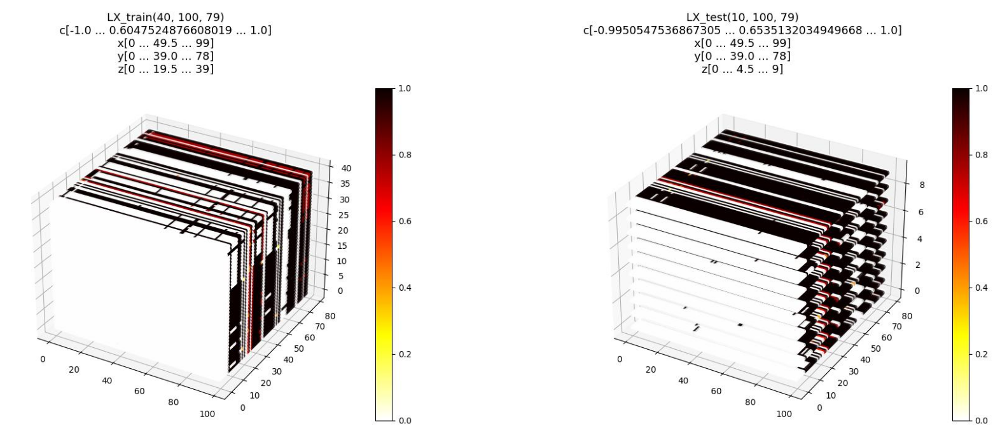

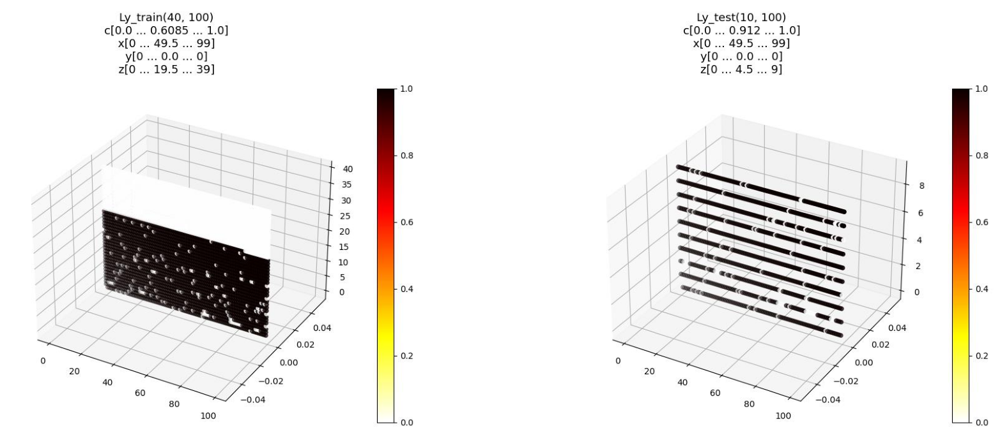

In [12]:
#@title overview featured vs normalized data IMG

show_4d_imgs(['LX_train','LX_test'])
show_4d_imgs(['Ly_train','Ly_test'])

# 4.INTRODUCTION

To create powerful models, especially for solving Seq2Seq learning problems, LSTM is the key layer.
To use LSTM effectively in models, we need to understand how it generates different results with respect to given parameters.

## 4.1.QUICK RECAP OF LSTM

### 4.1.1.Internal Structure

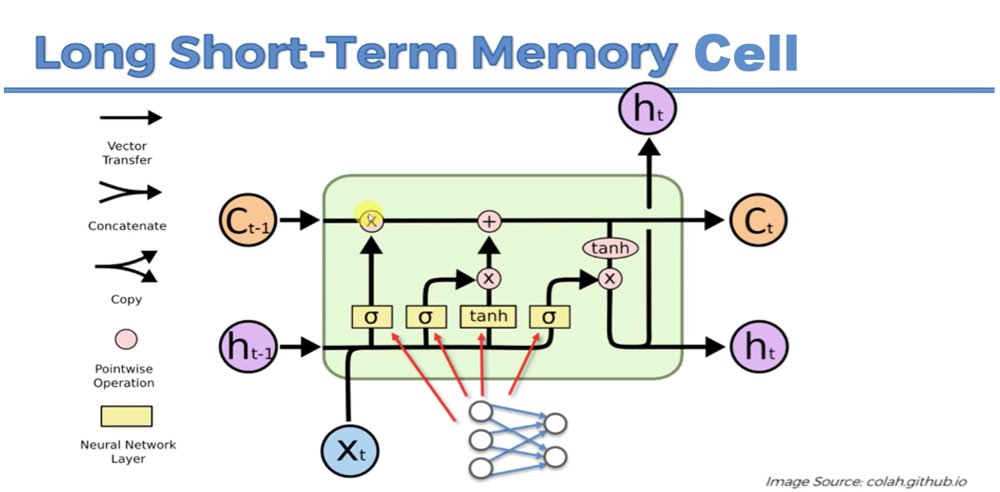

### 4.1.2.Roll-Out Representation of LSTM for each Time Step

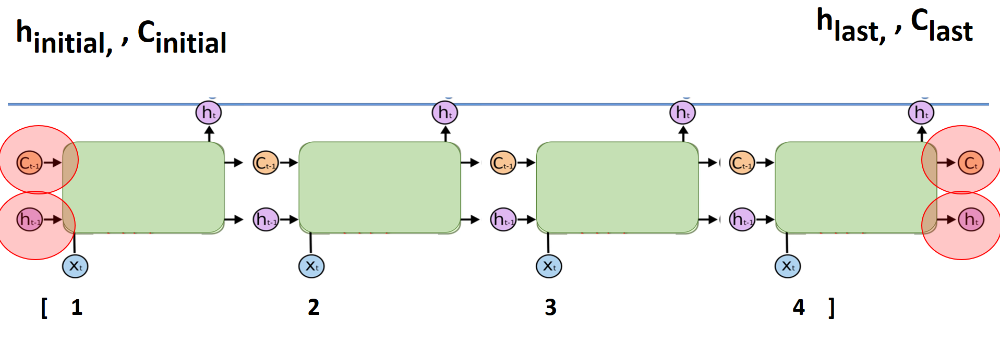

# 5.LSTM Anomaly State management

## 5.1.Model layers



In [13]:
def new_model5():
  num_outputs = 2
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model5: Model = Model(
      inputs=
      [
        input_layer,
        #seq_in,
        state_in_h,
        state_in_c
      ],
      outputs=[logits, values, state_h, state_c])
  return model5

model5 = new_model5()
model5.summary()

h = np.zeros((train_size, cell_size), np.float32)
c = np.zeros((train_size, cell_size), np.float32)
IMG['h'], IMG['c'] = ray.get([
    show_scattered_4d.remote(h, "h"),
    show_scattered_4d.remote(c, "c"),
])

2023-02-09 16:53:22.093969: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-02-09 16:53:22.094798: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-02-09 16:53:22.095585: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capability: 8.6
2023-02-09 16:53:22.096349: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 13348 MB memory:  -> device: 3, name: NVIDIA A16, pci bus id: 0000:42:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, None, 79)]   0           []                               
                                                                                                  
 dense1 (Dense)                 (None, None, 230)    18400       ['inputs[0][0]']                 
                                                                                                  
 h (InputLayer)                 [(None, 320)]        0           []                               
                                                                                                  
 c (InputLayer)                 [(None, 320)]        0           []                               
                                                                                              

## 5.2.Train



In [14]:
#@title state function

def train_state(model, x=LX_train, h=h, c=c, y=Ly_train, title=['model5', 'LX_train', 'h', 'c', 'Ly_train']):
  compile = model.predict([x, h, c])
  IMG[f"{title[4]}_predicted"], IMG[f"{title[4]}_h"], IMG[f"{title[4]}_c"] = ray.get([
    show_scattered_4d.remote(compile[1], f"{title[4]}_predicted"),
    show_scattered_4d.remote(compile[2], f"{title[4]}_h"),
    show_scattered_4d.remote(compile[3], f"{title[4]}_c"),
  ])

  show_4d_imgs([title[1], title[4], f"{title[4]}_predicted"])
  show_4d_imgs([title[1], title[2], f"{title[4]}_h"])
  show_4d_imgs([title[1], title[3], f"{title[4]}_c"])

2023-02-09 16:53:25.248111: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-02-09 16:53:26.296874: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8204


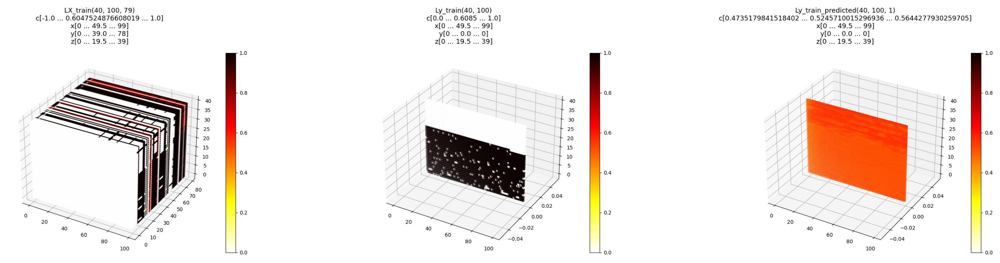

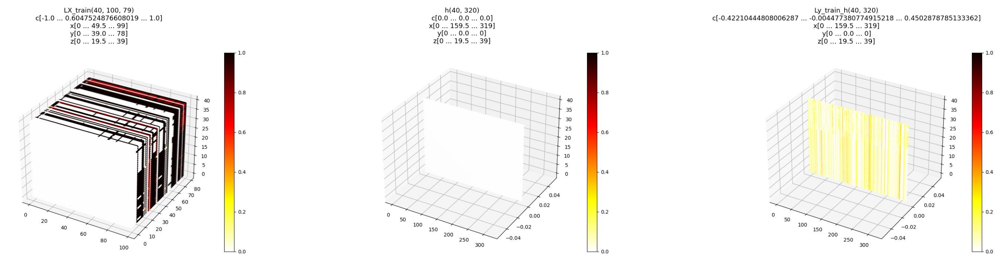

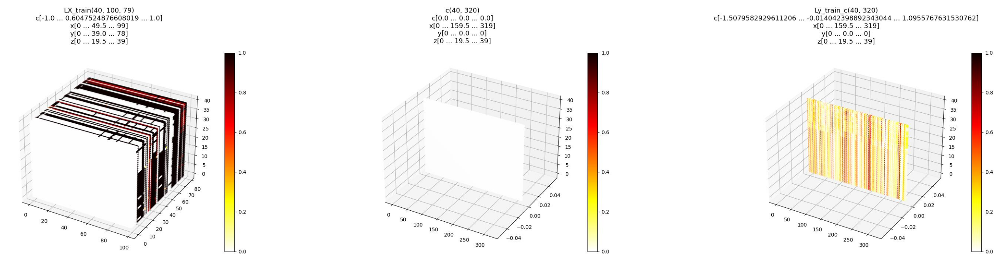

In [15]:
#@title train state

#model5.compile("adam", "binary_crossentropy", metrics=["accuracy"])
train_state(new_model5(), LX_train, h, c, Ly_train, ['model5', 'LX_train', 'h', 'c', 'Ly_train'])

In [16]:
#@title train function

def train_transfer(name='model', checkpoint='anomaly_flow79_local_ftp_norm'):
  model = keras.models.load_model(f"/usr/local/opnsense/scripts/ml/aicheckpoints/{checkpoint}/{name}")
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_train, Ly_train, batch_size=batch_size, epochs=epochs, validation_data=(LX_test, Ly_test))
  show_train_metric(history, name)
  model.save(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ftp_transfer_local_ssh_norm/{name}")
  open(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ftp_transfer_local_ssh_norm/{name}/features.json", "w").write(json.dumps(features))

In [17]:
## 5.3.Infer

In [18]:
#@title infer function

def infer(name='model', checkpoint='anomaly_flow79_local_ftp_transfer_local_ssh_norm'):
  model = keras.models.load_model(f"/usr/local/opnsense/scripts/ml/aicheckpoints/{checkpoint}/{name}")
  ##############LX_train
  L_result1=model.predict(LX_train)
  ##############LX_test
  L_result2=model.predict(LX_test)

  IMG['Ly_train_predicted'], IMG['Ly_test_predicted'] = ray.get([
    show_scattered_4d.remote(L_result1, "Ly_train_predicted"),
    show_scattered_4d.remote(L_result2, "Ly_test_predicted"),
  ])
  show_4d_imgs(['LX_train','Ly_train','Ly_train_predicted'])
  show_4d_imgs(['LX_test','Ly_test','Ly_test_predicted'])


___

# 6.LSTM Anomaly model (Primary)

## 6.1.Model layers



In [19]:
def new_model6():
  num_outputs = 10
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  #state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  #state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  #tf.nn.sigmoid
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      #initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model6: Model = Model(
      inputs=input_layer,
      #[
      #  input_layer, #seq_in,
      #  state_in_h,
      #  state_in_c
      #],
      outputs=values
      #[
      #  logits,
      #  values,
      #  state_h,
      #  state_c
      #]
      )
  return model6

model6 = new_model6()
model6.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, None, 79)]        0         
                                                                 
 dense1 (Dense)              (None, None, 230)         18400     
                                                                 
 lstm (LSTM)                 [(None, None, 320),       705280    
                              (None, 320),                       
                              (None, 320)]                       
                                                                 
 values (Dense)              (None, None, 1)           321       
                                                                 
Total params: 724,001
Trainable params: 724,001
Non-trainable params: 0
_________________________________________________________________


## 6.2.Train



Epoch 1/100
2/2 [==============================] - 2s 535ms/step - loss: 1.3655 - accuracy: 0.5207 - val_loss: 0.5142 - val_accuracy: 0.9240
Epoch 2/100
2/2 [==============================] - 0s 52ms/step - loss: 0.7865 - accuracy: 0.8683 - val_loss: 0.4246 - val_accuracy: 0.9260
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 0.6498 - accuracy: 0.8665 - val_loss: 0.2473 - val_accuracy: 0.9310
Epoch 4/100
2/2 [==============================] - 0s 52ms/step - loss: 0.3485 - accuracy: 0.9038 - val_loss: 0.4240 - val_accuracy: 0.8430
Epoch 5/100
2/2 [==============================] - 0s 51ms/step - loss: 0.3343 - accuracy: 0.8837 - val_loss: 0.3891 - val_accuracy: 0.8430
Epoch 6/100
2/2 [==============================] - 0s 53ms/step - loss: 0.2883 - accuracy: 0.8913 - val_loss: 0.2257 - val_accuracy: 0.9400
Epoch 7/100
2/2 [==============================] - 0s 52ms/step - loss: 0.2285 - accuracy: 0.9190 - val_loss: 0.1999 - val_accuracy: 0.9400
Epoch 8/100
2/2 [==

2023-02-09 16:53:41.613567: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


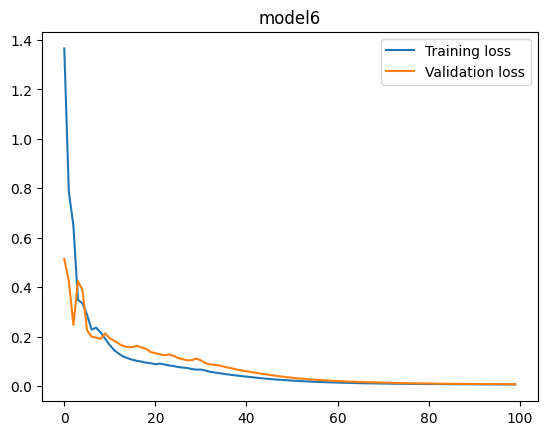

In [20]:
train_transfer('model6')

## 6.3.Infer



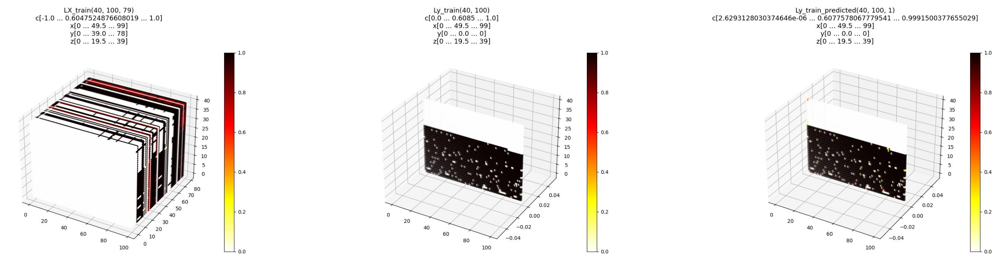

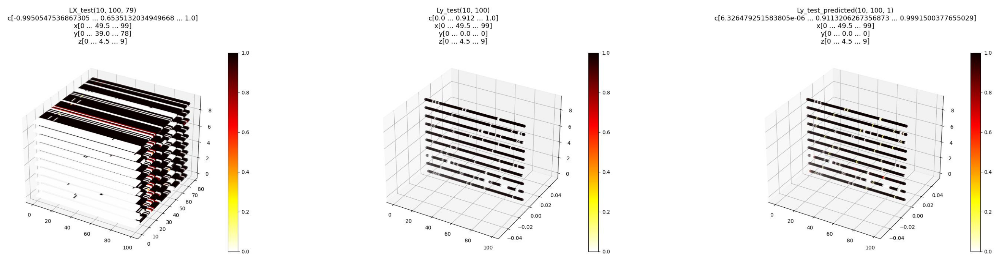

In [21]:
infer('model6')

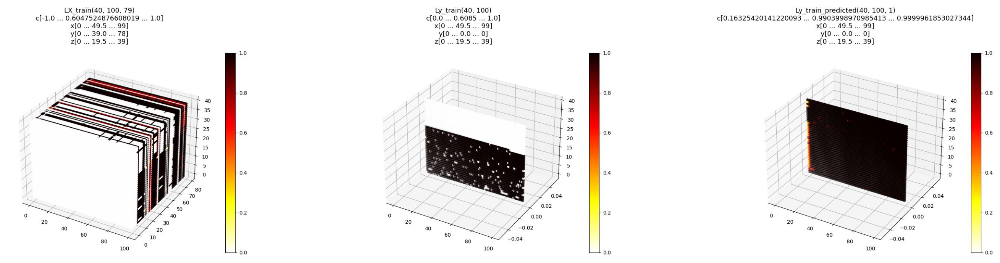

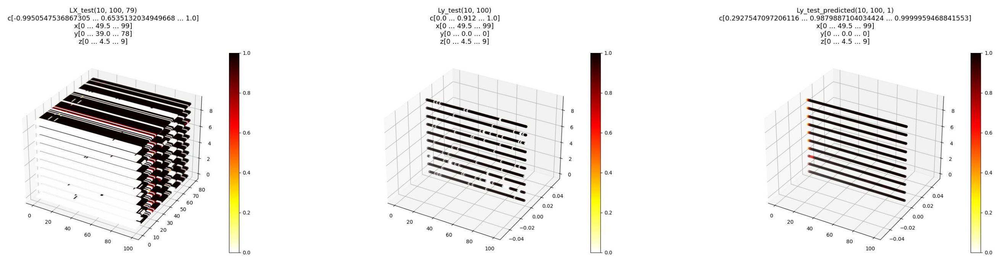

In [22]:
infer('model6', 'anomaly_flow79_cic_ssh_norm')

# 7.MODEL WEIGHTS SUMMARY

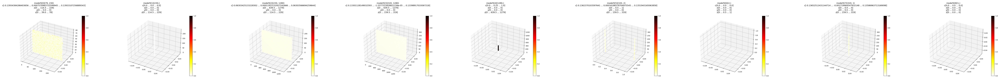

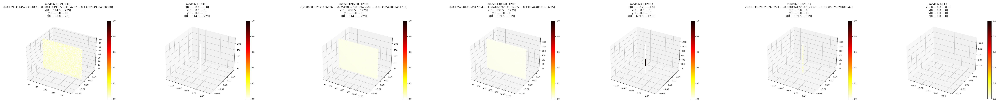

In [23]:
weights5 = show_weights(model5, 'model5')
weights6 = show_weights(model6, 'model6')

show_4d_imgs(weights5)
show_4d_imgs(weights6)